# PCB YOLO Training on Google Colab

End-to-end workflow for this repository:
1. Enable GPU runtime
2. Clone repo + install dependencies
3. Download Roboflow dataset
4. Train **one model per Colab session** (recommended)
5. Analyze metrics + run predictions on sample images
6. Back up weights to Google Drive

**Before you start:** Runtime -> Change runtime type -> **T4 GPU** (or better).

**Tip:** Colab sessions disconnect. Always back up to Drive after each training run.

In [ ]:
# 1) Check GPU
!nvidia-smi

import torch
assert torch.cuda.is_available(), "No GPU detected. Set Runtime -> Change runtime type -> GPU"
print("CUDA device:", torch.cuda.get_device_name(0))

Wed Aug 19 21:59:56 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   51C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# 2) Mount Google Drive (persistent storage for weights)
from google.colab import drive
drive.mount('/content/drive')

DRIVE_ROOT = "/content/drive/MyDrive/PCB-YOLO"
!mkdir -p "$DRIVE_ROOT"

Mounted at /content/drive


In [ ]:
# 3) Clone repository (replace URL if you forked it)
import os
from pathlib import Path

REPO_URL = "https://github.com/EdgarTad2002/Ensemble-methods-of-YOLO-models-for-PCB-detection.git"
PROJECT_ROOT = Path("/content/Ensemble-methods-of-YOLO-models-for-PCB-detection")

if not PROJECT_ROOT.exists():
    !git clone $REPO_URL $PROJECT_ROOT

%cd $PROJECT_ROOT
print("Working directory:", os.getcwd())

Cloning into '/content/Ensemble-methods-of-YOLO-models-for-PCB-detection'...
remote: Enumerating objects: 113, done.
remote: Counting objects: 100% (113/113), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 113 (delta 42), reused 103 (delta 32), pack-reused 0 (from 0)
Receiving objects: 100% (113/113), 9.97 MiB | 12.83 MiB/s, done.
Resolving deltas: 100% (42/42), done.
/content/Ensemble-methods-of-YOLO-models-for-PCB-detection
Working directory: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection


In [ ]:
# If there are changes in github repo you can run this
%cd /content/Ensemble-methods-of-YOLO-models-for-PCB-detection
!git pull

/content/Ensemble-methods-of-YOLO-models-for-PCB-detection
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0 (from 0)
Unpacking objects: 100% (4/4), 965 bytes | 965.00 KiB/s, done.
From https://github.com/EdgarTad2002/Ensemble-methods-of-YOLO-models-for-PCB-detection
   d96e75f..6a134c1  main       -> origin/main
Updating d96e75f..6a134c1
Fast-forward
 pcb_colab/colab_helpers.py | 37 ++++++++++++++++++++++++++++++++++++-
 1 file changed, 36 insertions(+), 1 deletion(-)


In [ ]:
# 4) Install dependencies
!pip install -q ultralytics ensemble-boxes roboflow pyyaml matplotlib pandas

In [ ]:
# 5) Roboflow API key
# Option A (recommended): Colab Secrets -> add ROBOFLOW_API_KEY
from google.colab import userdata

try:
    ROBOFLOW_API_KEY = userdata.get("ROBOFLOW_API_KEY")
except Exception:
    # Option B: paste key here temporarily (avoid saving notebook with key)
    ROBOFLOW_API_KEY = "YOUR_ROBOFLOW_API_KEY"

assert ROBOFLOW_API_KEY and ROBOFLOW_API_KEY != "YOUR_ROBOFLOW_API_KEY", "Set ROBOFLOW_API_KEY first"

In [ ]:
ROBOFLOW_API_KEY

'yqeIAWPG71sJwBctLOfx'

In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
print("Roboflow auth OK")

Roboflow auth OK


In [ ]:
# 6) Download dataset and place it where training scripts expect it
import sys
sys.path.insert(0, str(PROJECT_ROOT))

from pcb_colab.colab_helpers import download_roboflow_dataset, dataset_yaml

dataset_dir = download_roboflow_dataset(ROBOFLOW_API_KEY, project_root=PROJECT_ROOT)
print("data.yaml:", dataset_yaml(PROJECT_ROOT))

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to printed-circuit-board-3 in yolov8:: 100%|██████████| 1356/1356 [00:00<00:00, 5450.85it/s]


Dataset ready at: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8
YOLOv11 symlink: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov11 -> /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8
Merged 123 'iC' labels into 'IC' (class 22 -> 9)
data.yaml: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/data.yaml


In [ ]:
from collections import Counter
import glob

counts = Counter()
label_dir = "/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/train/labels"
for fpath in glob.glob(f"{label_dir}/*.txt"):
    with open(fpath) as f:
        for line in f:
            cls_id = int(line.split()[0])
            counts[cls_id] += 1

print("IC (idx 9):", counts[9])
print("iC (idx 22):", counts[22])

IC (idx 9): 5998
iC (idx 22): 0


In [ ]:
# Run this to be sure changes are in use after pull

# import importlib
# import pcb_colab.colab_helpers

# # Force Python to reload the module from the updated file on disk
# importlib.reload(pcb_colab.colab_helpers)

# # Re-import the variables/functions to ensure the session uses the new versions
# from pcb_colab.colab_helpers import MODEL_CONFIGS, train_model

# print("Successfully reloaded! Available models:", list(MODEL_CONFIGS.keys()))

In [ ]:
# 7) Choose ONE model to train in this session
from pcb_colab.colab_helpers import MODEL_CONFIGS, train_model

print("Available models:", list(MODEL_CONFIGS.keys()))

MODEL_KEY = "yolov11s"  # change per session: yolov5s, yolov8s, yolov9s, yolov10s, yolov11s, yolov12s, yolov26s
EPOCHS = 100
BATCH = 16  # use 8 if you hit CUDA OOM
IMGSZ = 640

results = train_model(
    MODEL_KEY,
    epochs=EPOCHS,
    batch=BATCH,
    imgsz=IMGSZ,
    device=0,
    workers=2,
    project_root=PROJECT_ROOT,
)

print("Run saved to:", results.save_dir)

Available models: ['yolov5s', 'yolov8s', 'yolov9s', 'yolov10s', 'yolov11s', 'yolov12s', 'yolov26s']
Training yolov11s on GPU 0
Data: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/data.yaml
Weights: yolo11s.pt
Ultralytics 8.4.120 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=False, classes=[2, 4, 7, 9], close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.

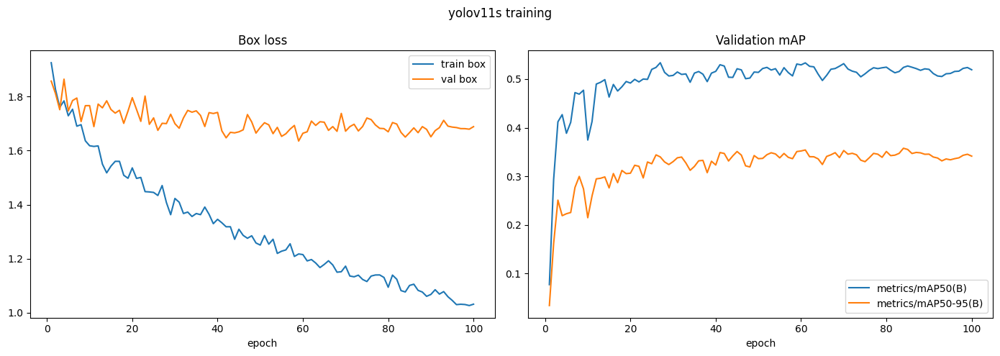

Ultralytics 8.4.120 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 101 layers, 9,421,701 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1931.7±271.3 MB/s, size: 115.2 KB)
val: Scanning /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/valid/labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 80/80 28.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 2.6s/it 13.2s
                   all         80      18601       0.11     0.0894     0.0911     0.0622
                Button         12         60          0          0          0          0
      Capacitor Jumper         40       3631          0          0          0          0
             Capacitor         40       3630      0.288     0.0598     0.0453     0.0196
                 Clock          6         10          0          

{'model': 'yolov11s',
 'weights': '/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/runs/yolov11/pcb-filtered/weights/best.pt',
 'mAP50': 0.09113795412573619,
 'mAP50_95': 0.06217111507530026,
 'precision': 0.10986579946573069,
 'recall': 0.08942007531353596}

In [ ]:
# 8) Analyze training curves + validation metrics
from pcb_colab.colab_helpers import analyze_model_results, run_dir_for

metrics = analyze_model_results(MODEL_KEY, project_root=PROJECT_ROOT)
metrics


image 1/44 /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/ATTIOT_Bottom_jpg.rf.8a97ad6664656973c60d95057d9d473c.jpg: 640x640 41 Capacitors, 23 Connectors, 7 ICs, 15.5ms
image 2/44 /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/ATTIOT_Bottom_jpg.rf.dff453ba63e165e5121d030998824ada.jpg: 640x640 40 Capacitors, 23 Connectors, 7 ICs, 15.6ms
image 3/44 /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/Arty_Bottom_jpg.rf.8b34dbef548b22055e8dae7322d65d13.jpg: 640x640 4 ICs, 15.5ms
image 4/44 /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/Arty_Bottom_jpg.rf.9be29f76cac7f5fe1445bb9efbdb5d54.jpg: 640x640 5 ICs, 15.6ms
image 5/44 /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/Arty_Top_jpg.rf.626c60b54fff4381b0cb8e6e3a044689.jpg: 640x640 1 

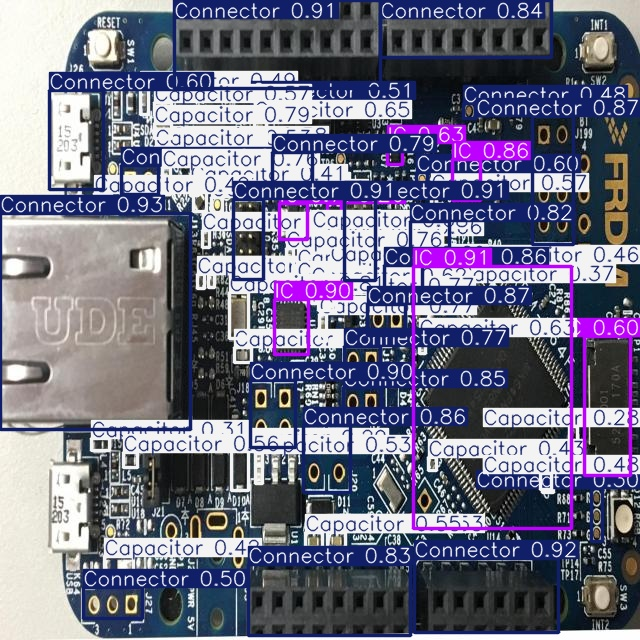

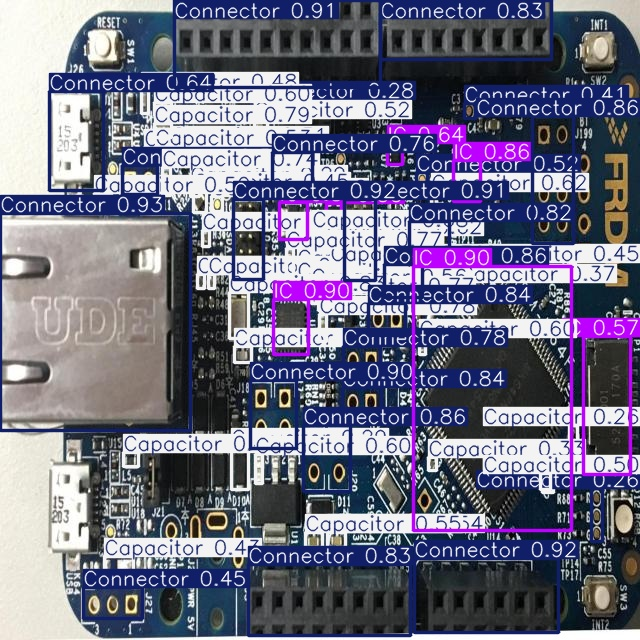

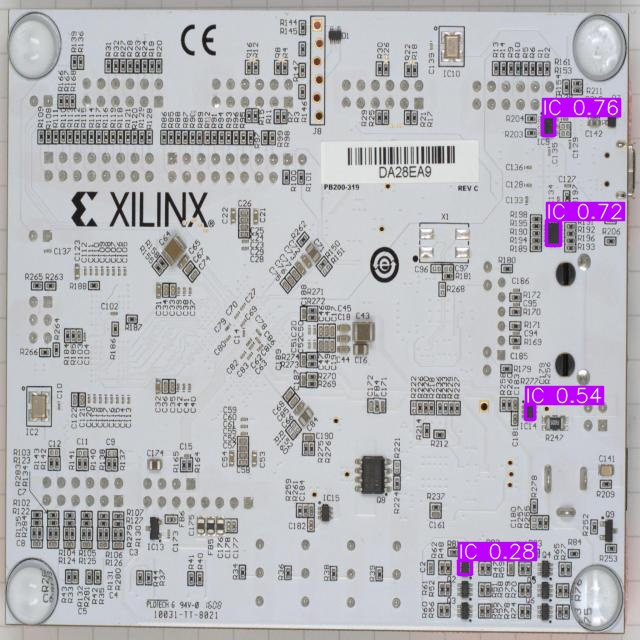

In [ ]:
# 9) Run inference on example images (test split by default)
from IPython.display import Image, display
from pcb_colab.colab_helpers import predict_examples, dataset_yaml

test_images = dataset_yaml(PROJECT_ROOT).parent / "test" / "images"
pred_dir = predict_examples(
    MODEL_KEY,
    test_images,
    conf=0.25,
    save_dir=PROJECT_ROOT / "colab_outputs" / f"{MODEL_KEY}_predictions",
    project_root=PROJECT_ROOT,
)

# Show first 3 annotated images
shown = 0
for img_path in sorted(pred_dir.glob("*.jpg")):
    display(Image(filename=str(img_path)))
    shown += 1
    if shown >= 3:
        break

In [ ]:
# Run this after training

from pathlib import Path
import pandas as pd
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml, backup_run_to_drive

# 1. Load the model from your local weights path
weights_path = Path("/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/runs/yolov11/pcb-filtered/weights/best.pt")
model = YOLO(str(weights_path))

# 2. Run validation on the TEST set focusing on your target classes
metrics = model.val(
    data=str(dataset_yaml(PROJECT_ROOT)),
    split='test',
    classes=[2, 4, 7, 9],
    conf=0.25,
    iou=0.5,
    device=0,
)

# 3. Extract speed metrics (Ultralytics stores speed as a dictionary: pre, inference, loss, post in ms)
speed_dict = metrics.speed

# We sum all three parts of the pipeline to get the 'Time (ms)' metric used in the paper
# Using .get(key, 0.0) ensures the code doesn't crash if a specific key is missing
preprocess_ms = speed_dict.get('preprocess', 0.0)
inference_ms = speed_dict.get('inference', 0.0)
postprocess_ms = speed_dict.get('postprocess', 0.0)

# Total Latency (This is the value you put in the 'Time (ms)' column of your table)
total_time_ms = preprocess_ms + inference_ms + postprocess_ms

# Correct FPS calculation based on the full processing cycle
fps = 1000.0 / total_time_ms if total_time_ms > 0 else 0.0

# 4. Compile all required metrics into a summary dictionary
test_summary = {
    "mAP50": float(metrics.box.map50),
    "mAP50_95": float(metrics.box.map),
    "precision": float(metrics.box.p.mean()),
    "recall": float(metrics.box.r.mean()),
    "total_time_ms": float(total_time_ms),
    "fps": float(fps)
}

print("\n--- Test Set Evaluation Results (Classes: 2, 4, 7, 9) ---")
for k, v in test_summary.items():
    print(f"{k}: {v:.4f}")

# 5. Save the summary CSV inside the weights' parent directory so it backs up together
run_weights_dir = weights_path.parent
summary_csv_path = run_weights_dir.parent / "test_results_summary.csv"
pd.DataFrame([test_summary]).to_csv(summary_csv_path, index=False)
print(f"\nSaved test metrics summary to: {summary_csv_path}")

# 6. Back up everything (weights, logs, plots, and the new summary CSV) to Google Drive
backup_path = backup_run_to_drive(
    MODEL_KEY,
    drive_root=DRIVE_ROOT,
    project_root=PROJECT_ROOT,
)
print(f"Successfully backed up everything to Google Drive at: {backup_path}")

FileNotFoundError: [Errno 2] No such file or directory: '/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/runs/yolov8s/pcb-filtered/weights/best.pt'

In [ ]:
# # Optional: download best.pt to your laptop from Colab files panel
# from colab.colab_helpers import run_dir_for

# best_weights = run_dir_for(MODEL_KEY, PROJECT_ROOT) / "weights" / "best.pt"
# print("Best weights:", best_weights)

# try:
#     from google.colab import files
#     files.download(str(best_weights))
# except Exception as exc:
#     print("Manual download only:", exc)

## Resume in a new Colab session

If Colab disconnects, mount Drive again and restore the latest backup:

```python
from colab.colab_helpers import restore_weights_from_drive
restore_weights_from_drive("yolov8s", drive_root=DRIVE_ROOT, project_root=PROJECT_ROOT)
```

Then copy restored weights into your local repo under the same `runs/...` paths used by ensemble scripts.

In [ ]:
from pathlib import Path
from ultralytics import YOLO
from IPython.display import Image, display
from pcb_colab.colab_helpers import restore_weights_from_drive, dataset_yaml

# 1. Restore your weights from Google Drive
MODEL_KEY = "yolov8s"
restored_run_dir = restore_weights_from_drive(
    model_key=MODEL_KEY,
    drive_root=DRIVE_ROOT,
    project_root=PROJECT_ROOT
)
best_weights_path = restored_run_dir / "weights" / "best.pt"

Restored yolov8s run to: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/runs/yolov8/pcb-filtered



--- Processing Image 1: ATTIOT_Bottom_jpg.rf.8a97ad6664656973c60d95057d9d473c.jpg ---


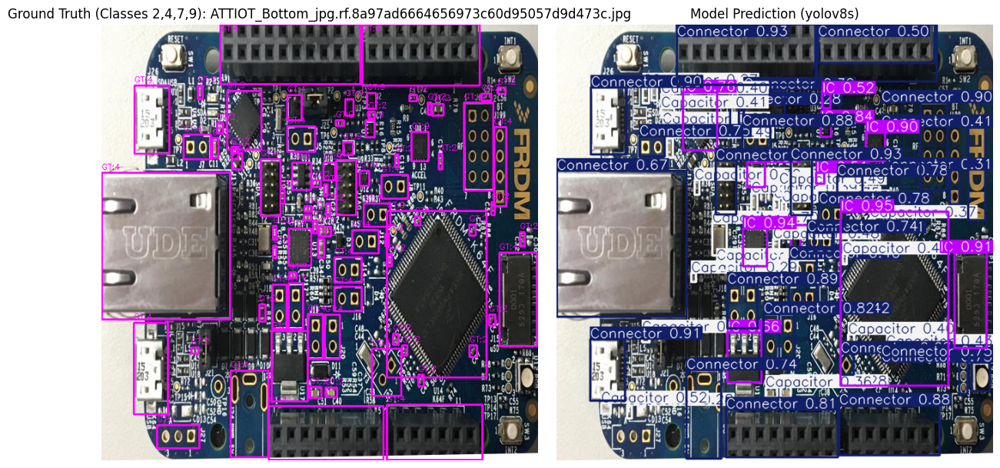


--- Processing Image 2: ATTIOT_Bottom_jpg.rf.dff453ba63e165e5121d030998824ada.jpg ---


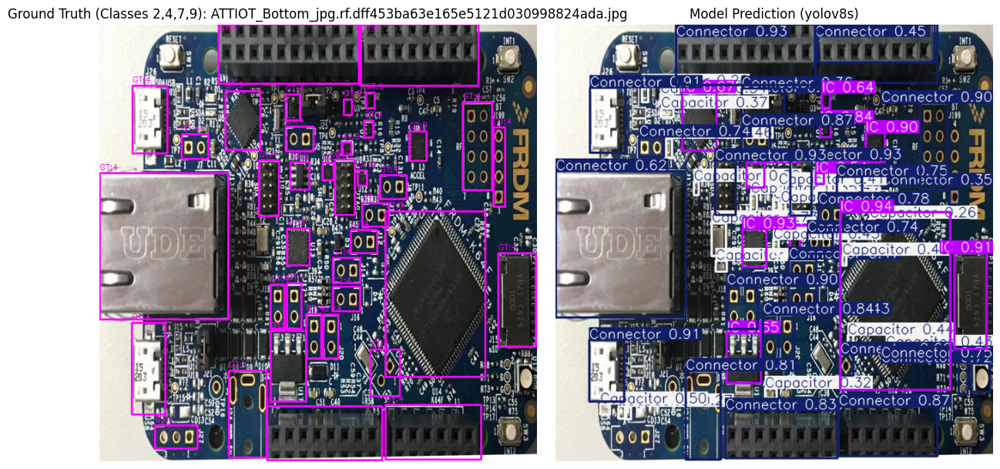


--- Processing Image 3: Arty_Bottom_jpg.rf.8b34dbef548b22055e8dae7322d65d13.jpg ---


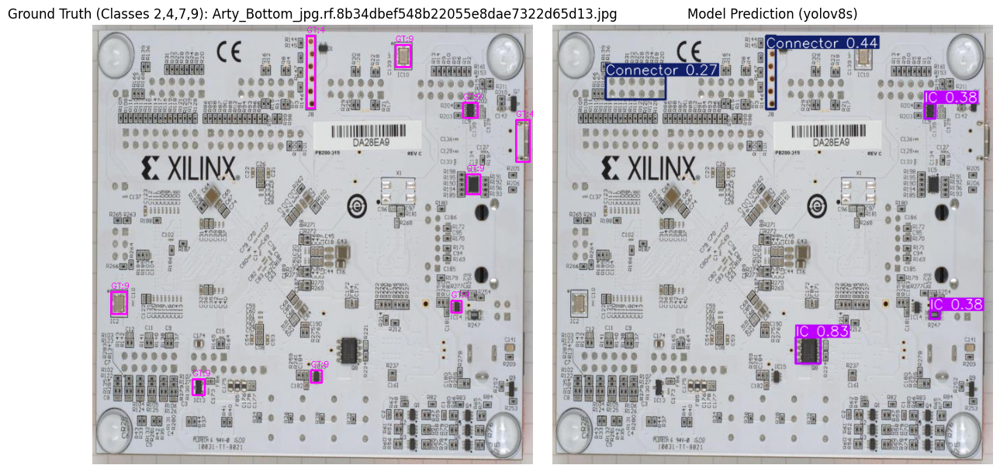


--- Processing Image 4: Arty_Bottom_jpg.rf.9be29f76cac7f5fe1445bb9efbdb5d54.jpg ---


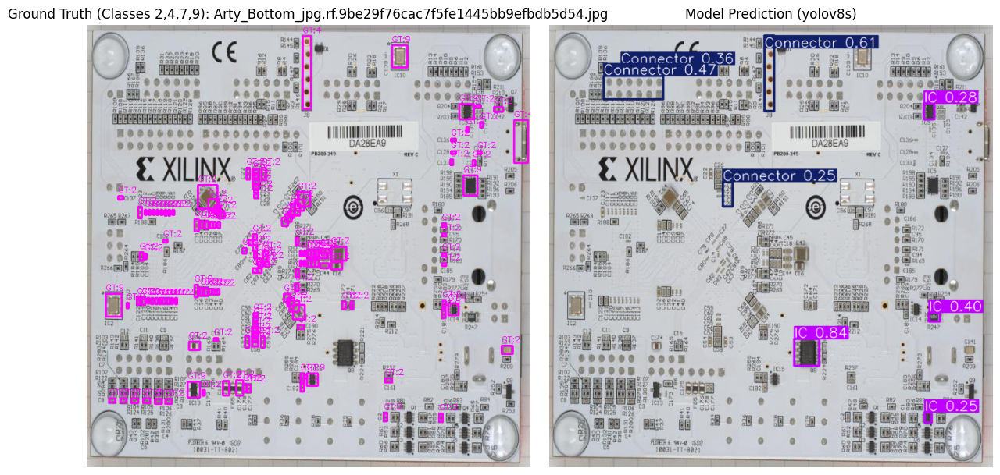


--- Processing Image 5: Arty_Top_jpg.rf.626c60b54fff4381b0cb8e6e3a044689.jpg ---


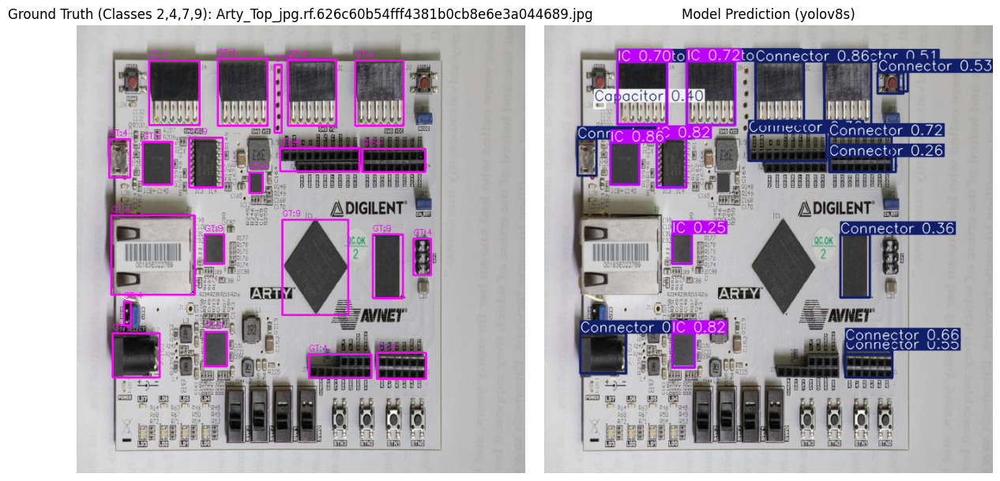


--- Processing Image 6: Arty_Top_jpg.rf.8a2361ff2b0de21f7c25814079fecb18.jpg ---


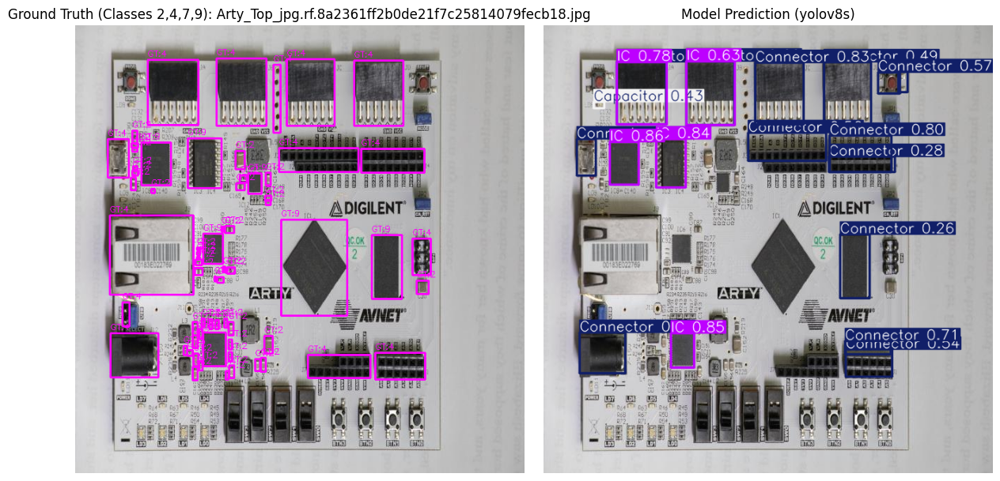


--- Processing Image 7: DuetWIFI_Top_png_jpg.rf.07bbc49d2ead513b2b7f2224b8ae9921.jpg ---


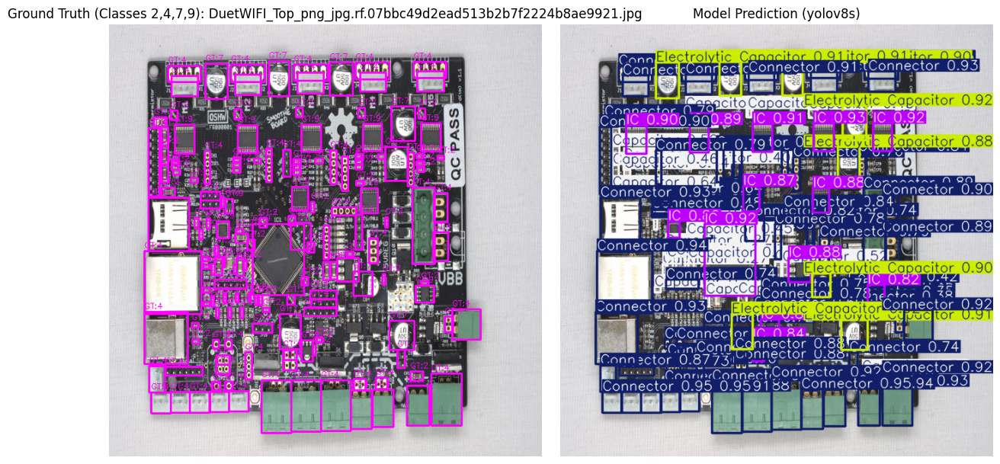


--- Processing Image 8: DuetWIFI_Top_png_jpg.rf.bb4dd20dee68b692f60e78bd86a39b70.jpg ---


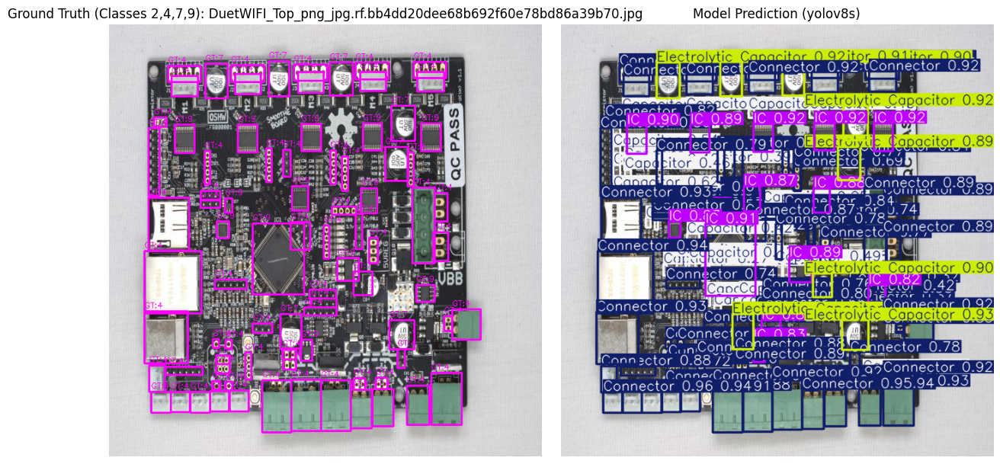


--- Processing Image 9: XCM-307A_Top_jpg.rf.788e5d4551d4661f4ff061bc28646da9.jpg ---


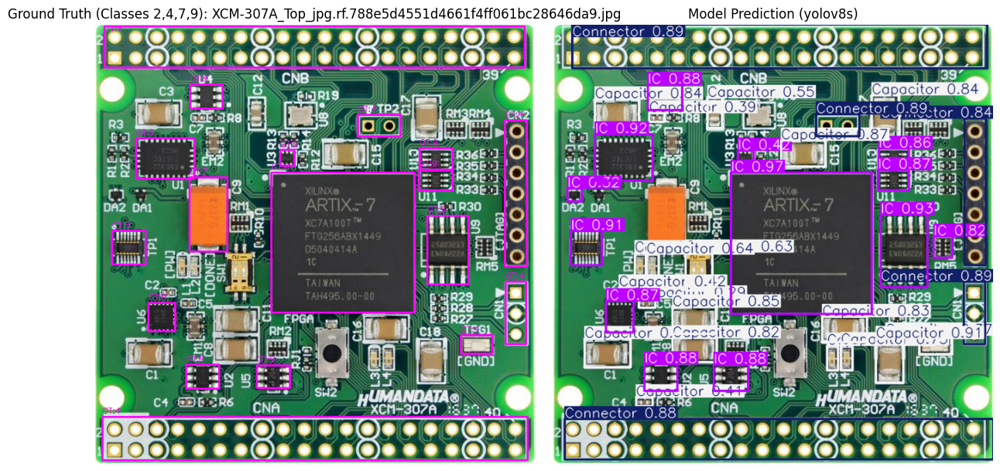


--- Processing Image 10: XCM-307A_Top_jpg.rf.d29c4b5abae28ea1fe92c201cfad96da.jpg ---


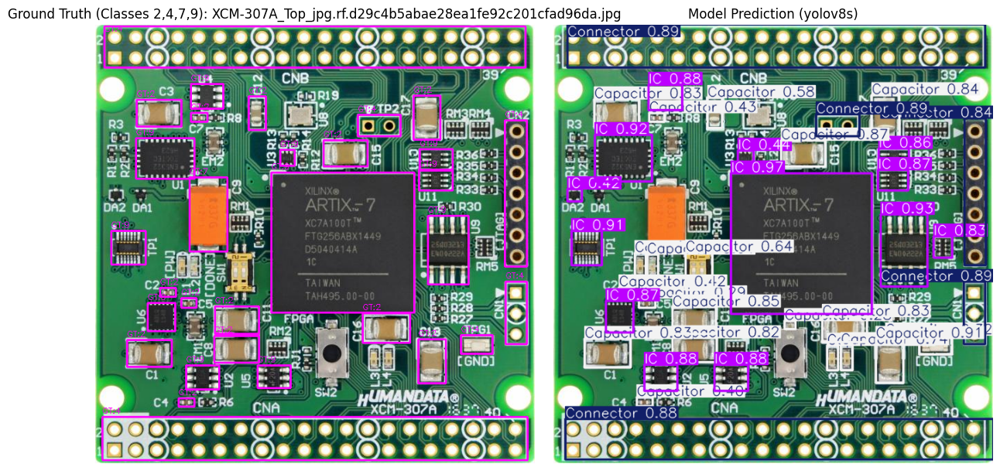

In [ ]:
import cv2, matplotlib.pyplot as plt

model = YOLO(str(best_weights_path))
TARGET_CLASSES = {2, 4, 7, 9}
dataset_root = dataset_yaml(PROJECT_ROOT).parent
test_images_dir = dataset_root / "test" / "images"
test_labels_dir = dataset_root / "test" / "labels"

# 3. Get up to 10 test image files
image_paths = sorted(list(test_images_dir.glob("*.jpg")))[:10]

for idx, img_path in enumerate(image_paths):
    print(f"\n--- Processing Image {idx + 1}: {img_path.name} ---")

    # Load image using OpenCV
    img_gt = cv2.imread(str(img_path))
    if img_gt is None:
        continue
    img_height, img_width, _ = img_gt.shape

    # Find the corresponding label file (.txt)
    label_path = test_labels_dir / f"{img_path.stem}.txt"

    # Draw Ground Truth boxes ONLY for classes 2, 4, 7, 9 in Magenta (BGR: 255, 0, 255)
    if label_path.exists():
        with open(label_path, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if not parts:
                    continue
                cls_id = int(parts[0])

                # Skip classes that are not part of your trained set
                if cls_id not in TARGET_CLASSES:
                    continue

                x_center, y_center, w, h = map(float, parts[1:])

                # Convert normalized YOLO format to pixel coordinates
                box_w = w * img_width
                box_h = h * img_height
                x_min = int((x_center * img_width) - (box_w / 2))
                y_min = int((y_center * img_height) - (box_h / 2))
                x_max = int((x_center * img_width) + (box_w / 2))
                y_max = int((y_center * img_height) + (box_h / 2))

                # Draw ground truth rectangle
                cv2.rectangle(img_gt, (x_min, y_min), (x_max, y_max), (255, 0, 255), 2)
                cv2.putText(img_gt, f"GT:{cls_id}", (x_min, max(y_min - 5, 10)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 255), 1)

    # Run model prediction on this single image
    results = model.predict(source=str(img_path), conf=0.25, verbose=False)
    img_pred = results[0].plot()

    # 5. Display Side-by-Side Comparison
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Ground Truth (Classes 2,4,7,9): {img_path.name}")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Model Prediction ({MODEL_KEY})")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
# 3. Run validation and take the mean across all classes
metrics = model.val(
    data=str(dataset_yaml(PROJECT_ROOT)),
    split='test',
    classes=[2, 4, 7, 9],
    conf=0.25,
    iou=0.5,
    device=0,
)

precision = float(metrics.box.p.mean()) * 100  # Mean precision across classes
recall = float(metrics.box.r.mean()) * 100     # Mean recall across classes
map50 = float(metrics.box.map50) * 100         # mAP at IoU 0.50
speed = metrics.speed  # dictionary containing 'preprocess', 'inference', 'postprocess'
avg_time_ms = speed['preprocess'] + speed['inference'] + speed['postprocess']  # or sum them up: sum(speed.values())
fps = 1000.0 / avg_time_ms

# ... (keep your inference speed / timing test code here) ...

# 5. Print formatted results for your paper table
print("\n" + "="*60)
print(f"Table row format for: {MODEL_KEY.upper()}")
print("="*60)
print(f"Model\t\tPrecision\tRecall\tmAP@0.5\t\tTime (ms)\tFPS")
print(f"{MODEL_KEY}\t\t{precision:.1f}%\t\t{recall:.1f}%\t{map50:.2f}%\t\t{avg_time_ms:.1f}\t\t{fps:.1f}")
print("="*60)

Ultralytics 8.4.120 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2647.0±774.1 MB/s, size: 95.3 KB)
val: Scanning /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/labels.cache... 44 images, 0 backgrounds, 2 corrupt: 100% ━━━━━━━━━━━━ 44/44 13.2Mit/s 0.0s
val: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/pcb163rec1_jpg.rf.b74addc8dfd2fcfaa84e598a0bda7be1.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/pcb163rec1_jpg.rf.d229ab603d5131ac752de0b6624904f2.jpg: ignoring corrupt image/label: labels mix segment and detection rows
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.0it/s 2.9s
                   all         42       2859      

## Ablation Study: YOLO26s-P2 Combined Run (Run D)

This section trains a **custom** YOLO26s variant combining three improvements aimed at the weak `Capacitor` class:
1. **P2 small-object detection head** (`yolo26s-p2.yaml`) — no pretrained weights, needs more epochs
2. **Higher input resolution** (`imgsz=960` instead of 640)
3. **Copy-paste augmentation** (`copy_paste=0.3`) — synthetically boosts small-object training signal

This does **not** go through `train_model()` / `MODEL_CONFIGS`, since those assume a pretrained `.pt` checkpoint and the standard 640px/no-augmentation baseline settings used for the fair architecture comparison. This run is a separate, clearly-labeled experiment — not a drop-in replacement for the baseline YOLO26s row in your comparison table.

**Colab tips baked into this cell:**
- `batch=8` to start (imgsz=960 + P2 head uses much more GPU memory than the 640px baseline runs — drop to `batch=4` if you still hit CUDA OOM)
- `save_period=10` so you get a checkpoint every 10 epochs, not just at the end (protects against a Colab disconnect mid-run)
- If disconnected, use the **resume cell** below instead of restarting from scratch

In [ ]:
# Free GPU memory from any previously loaded model in this session before starting Run D
import torch, gc

try:
    del model
except NameError:
    pass
gc.collect()
torch.cuda.empty_cache()
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv

In [ ]:
# Run D: Combined (P2 head + imgsz=960 + copy_paste=0.3)
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml

RUN_D_KEY = "yolov26s_p2_combined"
RUN_D_PROJECT = PROJECT_ROOT / "runs" / RUN_D_KEY

model_d = YOLO("yolo26s-p2.yaml")

results_d = model_d.train(
    data=str(dataset_yaml(PROJECT_ROOT)),
    classes=[2, 4, 7, 9],
    epochs=150,
    imgsz=960,
    batch=8,             # lower than the 640px baseline's batch=16 — see markdown note above
    copy_paste=0.3,
    project=str(RUN_D_PROJECT),
    name="pcb-filtered",
    exist_ok=True,
    pretrained=True,
    optimizer="SGD",
    verbose=True,
    device=0,
    workers=2,
    patience=100,
    cache=True,
    plots=True,
    save=True,
    save_period=10,      # checkpoint every 10 epochs in case Colab disconnects
    val=True,
)

print("Run D saved to:", results_d.save_dir)

### If Colab disconnects mid-training, resume from the last checkpoint

Run this instead of the training cell above — it reads the saved hyperparameters from `last.pt` automatically, so you don't need to re-specify `imgsz`, `copy_paste`, etc.

In [ ]:
# Resume Run D after a Colab disconnect (only run this if training was interrupted)
from ultralytics import YOLO

RUN_D_KEY = "yolov26s_p2_combined"
RUN_D_PROJECT = PROJECT_ROOT / "runs" / RUN_D_KEY
last_checkpoint = RUN_D_PROJECT / "pcb-filtered" / "weights" / "last.pt"

assert last_checkpoint.exists(), f"No checkpoint found at {last_checkpoint} — run the training cell above instead"

model_d_resume = YOLO(str(last_checkpoint))
results_d = model_d_resume.train(resume=True)
print("Resumed run saved to:", results_d.save_dir)

### Evaluate Run D on the test set (same protocol as the baseline comparison)

In [ ]:
# Evaluate Run D — same conf/iou/classes/split as the baseline four-model comparison
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml

RUN_D_KEY = "yolov26s_p2_combined"
RUN_D_PROJECT = PROJECT_ROOT / "runs" / RUN_D_KEY
run_d_weights = RUN_D_PROJECT / "pcb-filtered" / "weights" / "best.pt"

model_d_eval = YOLO(str(run_d_weights))

metrics_d = model_d_eval.val(
    data=str(dataset_yaml(PROJECT_ROOT)),
    split="test",
    classes=[2, 4, 7, 9],
    conf=0.25,
    iou=0.5,
    device=0,
)

speed_d = metrics_d.speed
total_time_ms_d = speed_d.get("preprocess", 0.0) + speed_d.get("inference", 0.0) + speed_d.get("postprocess", 0.0)
fps_d = 1000.0 / total_time_ms_d if total_time_ms_d > 0 else 0.0

run_d_summary = {
    "model": RUN_D_KEY,
    "mAP50": float(metrics_d.box.map50),
    "mAP50_95": float(metrics_d.box.map),
    "precision": float(metrics_d.box.p.mean()),
    "recall": float(metrics_d.box.r.mean()),
    "total_time_ms": float(total_time_ms_d),
    "fps": float(fps_d),
}

print("\n--- Run D Overall Metrics ---")
for k, v in run_d_summary.items():
    print(f"{k}: {v}")

class_names = ["Capacitor", "Connector", "Electrolytic Capacitor", "IC"]
print("\n--- Run D Per-Class AP@0.5 (check whether Capacitor recovered) ---")
for name, ap in zip(class_names, metrics_d.box.ap50):
    print(f"{name}: {ap:.4f}")

### Save Run D metrics into your comparison table + back up weights to Drive

In [ ]:
# Append Run D to your comparison CSV and back up weights to Google Drive
import shutil
import pandas as pd

comparison_csv = Path("/content/drive/MyDrive/PCB-YOLO/pcb_comparison_results.csv")

if comparison_csv.exists():
    df = pd.read_csv(comparison_csv)
    df = df[df["model"] != RUN_D_KEY]  # avoid duplicate rows if re-run
    df = pd.concat([df, pd.DataFrame([run_d_summary])], ignore_index=True)
else:
    df = pd.DataFrame([run_d_summary])

df.to_csv(comparison_csv, index=False)
print("Updated comparison table:")
print(df)

# Manual backup (bypasses backup_run_to_drive, since RUN_D_KEY isn't in MODEL_CONFIGS)
drive_backup_dir = Path("/content/drive/MyDrive/PCB-YOLO/runs") / RUN_D_KEY
shutil.copytree(RUN_D_PROJECT, drive_backup_dir, dirs_exist_ok=True)
print(f"Backed up Run D to: {drive_backup_dir}")

## Ablation Study: Run E — Resolution Only

**Isolates one variable**: standard `yolo26s.pt` (pretrained, no P2 head, no copy_paste), trained only at higher resolution (`imgsz=832`) instead of the 640px baseline. This tells you how much of Run D's improvement (once measured) is attributable to resolution alone, separate from the P2 head or the augmentation.

**Kept consistent with your baseline YOLO26s run** for a fair control comparison: same `epochs=100`, same `optimizer="SGD"`, same pretrained starting weights, same `classes=[2, 4, 7, 9]`. The **only** thing that changes vs. your baseline YOLO26s run is `imgsz`.

**Memory note:** without the P2 head, this should fit comfortably at `batch=8` on a T4 (P2 was what pushed you into OOM territory before, not the resolution bump alone) — but the cell still starts conservative. Bump to `batch=16` only after confirming this runs cleanly.

In [ ]:
# Free GPU memory from any previously loaded model before starting Run E
import torch, gc

for var in ["model", "model_d", "model_d_eval", "model_d_resume"]:
    if var in globals():
        del globals()[var]
gc.collect()
torch.cuda.empty_cache()
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv

memory.used [MiB], memory.total [MiB]
3 MiB, 15360 MiB


In [ ]:
# Run E: Resolution only (standard YOLO26s architecture, imgsz=832, no copy_paste)
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml

RUN_E_KEY = "yolov26s_res832_only"
RUN_E_PROJECT = PROJECT_ROOT / "runs" / RUN_E_KEY

model_e = YOLO("yolo26s.pt")   # standard pretrained checkpoint, NOT the p2 yaml

results_e = model_e.train(
    data=str(dataset_yaml(PROJECT_ROOT)),
    classes=[2, 4, 7, 9],
    epochs=100,             # matches baseline YOLO26s run for a fair control
    imgsz=832,               # <-- the one variable under test
    batch=8,
    project=str(RUN_E_PROJECT),
    name="pcb-filtered",
    exist_ok=True,
    pretrained=True,
    optimizer="SGD",
    verbose=True,
    device=0,
    workers=2,
    patience=100,
    cache=True,
    plots=True,
    save=True,
    save_period=10,
    val=True,
)

print("Run E saved to:", results_e.save_dir)

Ultralytics 8.4.121 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=False, classes=[2, 4, 7, 9], close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=832, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s.pt, momentu

### If Colab disconnects mid-training, resume Run E from the last checkpoint

In [ ]:
# Resume Run E after a Colab disconnect (only run this if training was interrupted)
from ultralytics import YOLO

RUN_E_KEY = "yolov26s_res832_only"
RUN_E_PROJECT = PROJECT_ROOT / "runs" / RUN_E_KEY
last_checkpoint_e = RUN_E_PROJECT / "pcb-filtered" / "weights" / "last.pt"

assert last_checkpoint_e.exists(), f"No checkpoint found at {last_checkpoint_e} — run the training cell above instead"

model_e_resume = YOLO(str(last_checkpoint_e))
results_e = model_e_resume.train(resume=True)
print("Resumed Run E saved to:", results_e.save_dir)

### Evaluate Run E on the test set (same protocol as every other model)

In [ ]:
# Evaluate Run E — same conf/iou/classes/split as every other model in the comparison
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml

RUN_E_KEY = "yolov26s_res832_only"
RUN_E_PROJECT = PROJECT_ROOT / "runs" / RUN_E_KEY
run_e_weights = RUN_E_PROJECT / "pcb-filtered" / "weights" / "best.pt"

model_e_eval = YOLO(str(run_e_weights))

metrics_e = model_e_eval.val(
    data=str(dataset_yaml(PROJECT_ROOT)),
    split="test",
    classes=[2, 4, 7, 9],
    conf=0.25,
    iou=0.5,
    device=0,
)

speed_e = metrics_e.speed
total_time_ms_e = speed_e.get("preprocess", 0.0) + speed_e.get("inference", 0.0) + speed_e.get("postprocess", 0.0)
fps_e = 1000.0 / total_time_ms_e if total_time_ms_e > 0 else 0.0

run_e_summary = {
    "model": RUN_E_KEY,
    "mAP50": float(metrics_e.box.map50),
    "mAP50_95": float(metrics_e.box.map),
    "precision": float(metrics_e.box.p.mean()),
    "recall": float(metrics_e.box.r.mean()),
    "total_time_ms": float(total_time_ms_e),
    "fps": float(fps_e),
}

print("\n--- Run E Overall Metrics ---")
for k, v in run_e_summary.items():
    print(f"{k}: {v}")

class_names = ["Capacitor", "Connector", "Electrolytic Capacitor", "IC"]
print("\n--- Run E Per-Class AP@0.5 (this is the number that tells you if resolution alone helps Capacitor) ---")
for name, ap in zip(class_names, metrics_e.box.ap50):
    print(f"{name}: {ap:.4f}")

Ultralytics 8.4.121 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 122 layers, 9,474,081 parameters, 0 gradients, 20.8 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 36.2±18.0 MB/s, size: 104.2 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/labels... 44 images, 0 backgrounds, 2 corrupt: 100% ━━━━━━━━━━━━ 44/44 269.3it/s 0.2s
val: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/pcb163rec1_jpg.rf.b74addc8dfd2fcfaa84e598a0bda7be1.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/pcb163rec1_jpg.rf.d229ab603d5131ac752de0b6624904f2.jpg: ignoring co

### Save Run E metrics into your comparison table + back up weights to Drive

In [ ]:
# Append Run E to your comparison CSV and back up weights to Google Drive
import shutil
import pandas as pd

comparison_csv = Path("/content/drive/MyDrive/PCB-YOLO/pcb_comparison_results.csv")

if comparison_csv.exists():
    df = pd.read_csv(comparison_csv)
    df = df[df["model"] != RUN_E_KEY]  # avoid duplicate rows if re-run
    df = pd.concat([df, pd.DataFrame([run_e_summary])], ignore_index=True)
else:
    df = pd.DataFrame([run_e_summary])

df.to_csv(comparison_csv, index=False)
print("Updated comparison table:")
print(df)

# Manual backup (bypasses backup_run_to_drive, since RUN_E_KEY isn't in MODEL_CONFIGS)
drive_backup_dir = Path("/content/drive/MyDrive/PCB-YOLO/runs") / RUN_E_KEY
shutil.copytree(RUN_E_PROJECT, drive_backup_dir, dirs_exist_ok=True)
print(f"Backed up Run E to: {drive_backup_dir}")

Updated comparison table:
                  model     mAP50  mAP50_95  precision    recall  \
0               yolov8s  0.489346  0.359390   0.664731  0.502520   
1              yolov10s  0.480801  0.372578   0.657563  0.526545   
2              yolov11s  0.497592  0.381897   0.665505  0.504981   
3              yolov26s  0.473379  0.351836   0.682124  0.441302   
4  yolov26s_p2_combined  0.385490  0.253179   0.533253  0.423358   
5  yolov26s_res832_only  0.453259  0.337292   0.668098  0.496771   

   total_time_ms        fps  
0      71.289317  14.027347  
1      27.755323  36.029125  
2      45.420547  22.016468  
3      22.815854  43.829172  
4      96.385804  10.374972  
5      39.243695  25.481800  
Backed up Run E to: /content/drive/MyDrive/PCB-YOLO/runs/yolov26s_res832_only


### Quick comparison: Run E vs. baseline YOLO26s vs. Run D (once available)

Run this after Run E's evaluation cell to see, at a glance, whether resolution alone recovered any Capacitor AP relative to your original YOLO26s baseline (1.20%).

In [ ]:
# Quick side-by-side: baseline YOLO26s vs. Run E (resolution only) per-class AP
baseline_ap = {"Capacitor": 0.0120, "Connector": 0.6003, "Electrolytic Capacitor": 0.7750, "IC": 0.5062}  # from your earlier baseline eval
run_e_ap = dict(zip(class_names, [float(x) for x in metrics_e.box.ap50]))

print(f"{'Class':<25}{'Baseline (640px)':<20}{'Run E (832px)':<20}{'Delta':<10}")
for cls in class_names:
    delta = run_e_ap[cls] - baseline_ap[cls]
    print(f"{cls:<25}{baseline_ap[cls]:<20.4f}{run_e_ap[cls]:<20.4f}{delta:+.4f}")

Class                    Baseline (640px)    Run E (832px)       Delta     
Capacitor                0.0120              0.0340              +0.0220
Connector                0.6003              0.5443              -0.0560
Electrolytic Capacitor   0.7750              0.7063              -0.0687
IC                       0.5062              0.5284              +0.0222


## Ablation Study: Run G — geometric + color augmentation (no mixup/copy_paste)

In [ ]:
# Run G: Train YOLO model with geometric + color augmentation (no mixup/copy_paste)
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml

RUN_G_KEY = "yolov26s_geo_hsv_aug"
RUN_G_PROJECT = PROJECT_ROOT / "runs" / RUN_G_KEY

model_g = YOLO("yolo26s.pt")   # standard pretrained checkpoint

results_g = model_g.train(
    data=str(dataset_yaml(PROJECT_ROOT)),
    classes=[2, 4, 7, 9],
    epochs=100,              # matches baseline for a fair comparison
    imgsz=640,
    batch=16,
    project=str(RUN_G_PROJECT),
    name="pcb-filtered",
    exist_ok=True,
    pretrained=True,
    optimizer="SGD",
    verbose=True,
    device=0,
    workers=2,
    patience=100,
    cache=True,
    plots=True,
    save=True,
    save_period=10,
    val=True,

    # --- Geometric augmentation ---
    scale=0.8,
    translate=0.1,
    degrees=10.0,
    shear=0.0,
    perspective=0.0,

    # --- Color augmentation ---
    hsv_h=0.015,      # default — conservative, hue shifts can misrepresent component color cues
    hsv_s=0.7,        # default
    hsv_v=0.4,        # default, mild lighting robustness

    # --- Mosaic ---
    mosaic=1.0,
    close_mosaic=15,  # longer clean-image tail before convergence, given small dataset

    # --- Flips ---
    fliplr=0.5,       # default
    flipud=0.0,        # off — no confirmed vertical-orientation invariance for these boards

    # --- Explicitly disabled ---
    mixup=0.0,
    copy_paste=0.0,
)

print("Run G saved to:", results_g.save_dir)

Ultralytics 8.4.123 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=False, classes=[2, 4, 7, 9], close_mosaic=15, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s.pt, momen

In [ ]:
# Evaluate Run G — same conf/iou/classes/split as your other comparisons
from ultralytics import YOLO
from pcb_colab.colab_helpers import dataset_yaml

run_g_weights = RUN_G_PROJECT / "pcb-filtered" / "weights" / "best.pt"
model_g_eval = YOLO(str(run_g_weights))

metrics_g = model_g_eval.val(
    data=str(dataset_yaml(PROJECT_ROOT)),
    split="test",
    classes=[2, 4, 7, 9],
    conf=0.25,
    iou=0.5,
    device=0,
)

speed_g = metrics_g.speed
total_time_ms_g = speed_g.get("preprocess", 0.0) + speed_g.get("inference", 0.0) + speed_g.get("postprocess", 0.0)
fps_g = 1000.0 / total_time_ms_g if total_time_ms_g > 0 else 0.0

run_g_summary = {
    "model": RUN_G_KEY,
    "mAP50": float(metrics_g.box.map50),
    "mAP50_95": float(metrics_g.box.map),
    "precision": float(metrics_g.box.p.mean()),
    "recall": float(metrics_g.box.r.mean()),
    "total_time_ms": float(total_time_ms_g),
    "fps": float(fps_g),
}

print("\n--- Run G Overall Metrics ---")
for k, v in run_g_summary.items():
    print(f"{k}: {v}")

class_names = ["Capacitor", "Connector", "Electrolytic Capacitor", "IC"]
print("\n--- Run G Per-Class AP@0.5 ---")
for name, ap in zip(class_names, metrics_g.box.ap50):
    print(f"{name}: {ap:.4f}")

Ultralytics 8.4.123 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 122 layers, 9,474,081 parameters, 0 gradients, 20.8 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 27.8±13.9 MB/s, size: 104.2 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/labels... 44 images, 0 backgrounds, 2 corrupt: 100% ━━━━━━━━━━━━ 44/44 343.7it/s 0.1s
val: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/pcb163rec1_jpg.rf.b74addc8dfd2fcfaa84e598a0bda7be1.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/Ensemble-methods-of-YOLO-models-for-PCB-detection/datasets/pcb-filtered-yolov8/test/images/pcb163rec1_jpg.rf.d229ab603d5131ac752de0b6624904f2.jpg: ignoring co

In [ ]:
# Append Run G to your comparison CSV and back up weights to Google Drive
import shutil
import pandas as pd

comparison_csv = Path("/content/drive/MyDrive/PCB-YOLO/pcb_comparison_results.csv")

if comparison_csv.exists():
    df = pd.read_csv(comparison_csv)
    df = df[df["model"] != RUN_G_KEY]  # avoid duplicate rows if re-run
    df = pd.concat([df, pd.DataFrame([run_g_summary])], ignore_index=True)
else:
    df = pd.DataFrame([run_g_summary])

df.to_csv(comparison_csv, index=False)
print("Updated comparison table:")
print(df)

# Manual backup (bypasses backup_run_to_drive, since RUN_G_KEY isn't in MODEL_CONFIGS)
drive_backup_dir = Path("/content/drive/MyDrive/PCB-YOLO/runs") / RUN_G_KEY
shutil.copytree(RUN_G_PROJECT, drive_backup_dir, dirs_exist_ok=True)
print(f"Backed up Run G to: {drive_backup_dir}")

Updated comparison table:
                  model     mAP50  mAP50_95  precision    recall  \
0               yolov8s  0.489346  0.359390   0.664731  0.502520   
1              yolov10s  0.480801  0.372578   0.657563  0.526545   
2              yolov11s  0.497592  0.381897   0.665505  0.504981   
3              yolov26s  0.473379  0.351836   0.682124  0.441302   
4  yolov26s_p2_combined  0.385490  0.253179   0.533253  0.423358   
5  yolov26s_res832_only  0.453259  0.337292   0.668098  0.496771   
6  yolov26s_geo_hsv_aug  0.456830  0.307116   0.631500  0.512312   

   total_time_ms        fps  
0      71.289317  14.027347  
1      27.755323  36.029125  
2      45.420547  22.016468  
3      22.815854  43.829172  
4      96.385804  10.374972  
5      39.243695  25.481800  
6      29.462203  33.941794  
Backed up Run G to: /content/drive/MyDrive/PCB-YOLO/runs/yolov26s_geo_hsv_aug
